# Final Data Visualization Project
---

Course: Data Visualization

Submission Date: Mar 28, 2022

Student: Mathias Schindler

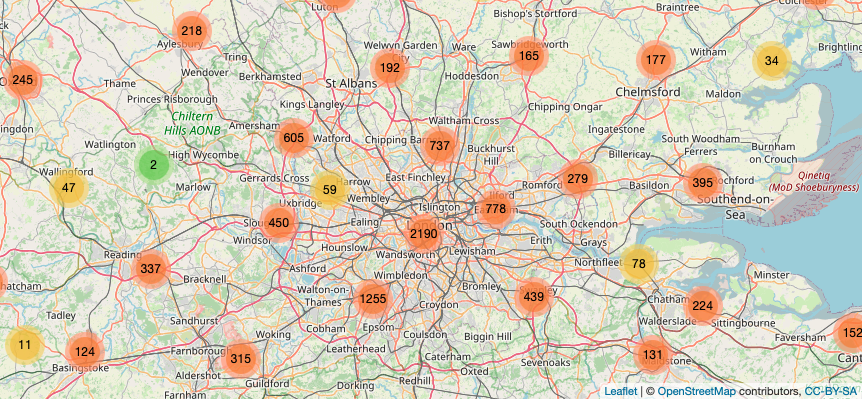

# Preamble

In [1]:
# Set R console language to English
Sys.setenv(LANG = "en")

The versions of packages used when this script originallay was developed in `R`version 4.12 are
- `plyr`: 1.8.6
- `dplyr`: 1.0.8
- `ggplot2`: 3.3.5
- `ggpubr`: 0.4.0
- `rgdal`: 1.5.28
- `geojsonio`: 0.9.4
- `lubridate`: 1.8.0
- `cowplot`: 1.1.1
- `leaflet`: 2.0.4.1
- `reshape`: 0.8.8
- `raster`: 3.5.15
- `RColorBrewer`: 1.1.2

In [2]:
# Load packages
library(plyr)
library(dplyr)
library(ggplot2)
library(ggpubr)
library(rgdal)
library(geojsonio)
library(lubridate)
library(cowplot)
library(leaflet)
library(reshape)
library(raster)
library(RColorBrewer)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘ggpubr’


The following object is masked from ‘package:plyr’:

    mutate


Loading required package: sp

Please note that rgdal will be retired by the end of 2023,
plan transition to sf/stars/terra functions using GDAL and PROJ
at your earliest convenience.

rgdal: version: 1.5-28, (SVN revision 1158)
Geospatial Data Abstraction Library extensions to R successfully loaded
Loaded GDAL runtime: GDAL 3.4.1, released 2021/12/27
Path to GDAL shared files: /Users/mathiasschindler/opt/anaconda3/envs/dataviz/share/gdal
GDAL binary built with GEOS: TRUE 
Loaded PROJ runtime: Rel. 8.2.1, January 1st, 2022, [PJ_VERSION: 821]
Path to PROJ shar

In [3]:
print("Versions installed on the computer running this script:")
paste("Package version of plyr:", packageVersion("plyr"))
paste("Package version of dplyr:", packageVersion("dplyr"))
paste("Package version of ggplot2:", packageVersion("ggplot2"))
paste("Package version of ggpubr:", packageVersion("ggpubr"))
paste("Package version of rgdal:", packageVersion("rgdal"))
paste("Package version of geojsonio:", packageVersion("geojsonio"))
paste("Package version of lubridate:", packageVersion("lubridate"))
paste("Package version of cowplot:", packageVersion("cowplot"))
paste("Package version of leaflet:", packageVersion("leaflet"))
paste("Package version of reshape:", packageVersion("reshape"))
paste("Package version of raster:", packageVersion("raster"))
paste("Package version of RColorBrewer:", packageVersion("RColorBrewer"))

[1] "Versions installed on the computer running this script:"


[1] "Package version of plyr: 1.8.6"

[1] "Package version of dplyr: 1.0.8"

[1] "Package version of ggplot2: 3.3.5"

[1] "Package version of ggpubr: 0.4.0"

[1] "Package version of rgdal: 1.5.28"

[1] "Package version of geojsonio: 0.9.4"

[1] "Package version of lubridate: 1.8.0"

[1] "Package version of cowplot: 1.1.1"

[1] "Package version of leaflet: 2.0.4.1"

[1] "Package version of reshape: 0.8.8"

[1] "Package version of raster: 3.5.15"

[1] "Package version of RColorBrewer: 1.1.2"

In [4]:
R.Version()

$platform
[1] "x86_64-apple-darwin13.4.0"

$arch
[1] "x86_64"

$os
[1] "darwin13.4.0"

$system
[1] "x86_64, darwin13.4.0"

$status
[1] ""

$major
[1] "4"

$minor
[1] "1.2"

$year
[1] "2021"

$month
[1] "11"

$day
[1] "01"

$`svn rev`
[1] "81115"

$language
[1] "R"

$version.string
[1] "R version 4.1.2 (2021-11-01)"

$nickname
[1] "Bird Hippie"

In [5]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-apple-darwin13.4.0 (64-bit)
Running under: macOS Big Sur 10.16

Matrix products: default
BLAS/LAPACK: /Users/mathiasschindler/opt/anaconda3/envs/dataviz/lib/libopenblasp-r0.3.18.dylib

locale:
[1] C/UTF-8/C/C/C/C

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] RColorBrewer_1.1-2 raster_3.5-15      reshape_0.8.8      leaflet_2.0.4.1   
 [5] cowplot_1.1.1      lubridate_1.8.0    geojsonio_0.9.4    rgdal_1.5-28      
 [9] sp_1.4-6           ggpubr_0.4.0       ggplot2_3.3.5      dplyr_1.0.8       
[13] plyr_1.8.6        

loaded via a namespace (and not attached):
 [1] tidyr_1.2.0        jsonlite_1.8.0     carData_3.0-5      assertthat_0.2.1  
 [5] pillar_1.7.0       backports_1.4.1    lattice_0.20-45    glue_1.6.2        
 [9] uuid_1.0-3         digest_0.6.29      ggsignif_0.6.3     colorspace_2.0-3  
[13] htmltools_0.5.2    pkgconfig_2.0.3    httpcode_0.3.0     

# Load Data

Data documentation below from [https://www.gov.uk/guidance/about-the-price-paid-data#explanations-of-column-headers-in-the-ppd](https://www.gov.uk/guidance/about-the-price-paid-data#explanations-of-column-headers-in-the-ppd):

| Column        | Are           
| ------------- |:-------------:
| Transaction unique identifier | A reference number which is generated automatically recording each published sale. The number is unique and will change each time a sale is recorded.
| Price      | Sale price stated on the transfer deed.      
| Date of Transfer	 | Date when the sale was completed, as stated on the transfer deed    
| Postcode | This is the postcode used at the time of the original transaction. Note that postcodes can be reallocated and these changes are not reflected in the Price Paid Dataset.   
| Property Type      | D = Detached, S = Semi-Detached, T = Terraced, F = Flats/Maisonettes, O = Other. Note that: (i) we only record the above categories to describe property type, we do not separately identify bungalow, (ii) end-of-terrace properties are included in the Terraced category above , (iii) ‘Other’ is only valid where the transaction relates to a property type that is not covered by existing values, for example where a property comprises more than one large parcel of land      
| Old/New	 | Indicates the age of the property and applies to all price paid transactions, residential and non-residential. Y = a newly built property, N = an established residential building   
| Duration      | Relates to the tenure: F = Freehold, L= Leasehold etc. Note that HM Land Registry does not record leases of 7 years or less in the Price Paid Dataset.      
| PAON | Primary Addressable Object Name. Typically the house number or name   
| SAON      | Secondary Addressable Object Name. Where a property has been divided into separate units (for example, flats), the PAON (above) will identify the building and a SAON will be specified that identifies the separate unit/flat.      
| Street  |    
| Locality      |       
| Town/City      |       
| District | 
| County      |       
| PPD Category Type  | Indicates the type of Price Paid transaction. A = Standard Price Paid entry, includes single residential property sold for value. B = Additional Price Paid entry including transfers under a power of sale/repossessions, buy-to-lets (where they can be identified by a Mortgage), transfers to non-private individuals and sales where the property type is classed as ‘Other’. Note that category B does not separately identify the transaction types stated. HM Land Registry has been collecting information on Category A transactions from January 1995. Category B transactions were identified from October 2013.
| Record Status - monthly file only      | Indicates additions, changes and deletions to the records.(see guide below). A = Addition, C = Change, D = Delete. Note that where a transaction changes category type due to misallocation (as above) it will be deleted from the original category type and added to the correct category with a new transaction unique identifier.      

In [6]:
# Set path
path = "/Users/mathiasschindler/Library/Mobile Documents/com~apple~CloudDocs/BSE/_T2-Data Viz/FinalProject/data"

# Set path for exports
out_path = "/Users/mathiasschindler/Library/Mobile Documents/com~apple~CloudDocs/BSE/_T2-Data Viz/FinalProject/out"

In [7]:
# Full dataset
# file = paste(path, "pp-complete.csv", sep = "/") 
# df = read.csv(file)
# head(df, 5)

# Subsample - when developing code / check code runs
file = paste(path, "ppdata_subs.csv", sep = "/") 
df = read.csv(file, na.strings=c("", " ", "NA"))
head(df, 5)

,transaction_unique_identifier,price,date_of_transfer,postcode,property_type,old_new,duration,PAON,SAON,street,locality,town_city,district,county,PPD_category_type,record_status
,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,{24EDE89B-CC0D-4990-9CBB-08F4739C4674},249950,2005-11-28 00:00,M27 0AG,T,N,F,304,NA,WORSLEY ROAD,SWINTON,MANCHESTER,SALFORD,GREATER MANCHESTER,A,A
2,{4D84F030-6E32-4CA5-8F90-7C2EA2B517D6},290000,2005-06-10 00:00,B73 5NX,S,N,F,66,NA,EASTERN ROAD,SUTTON COLDFIELD,SUTTON COLDFIELD,BIRMINGHAM,WEST MIDLANDS,A,A
3,{2A289EA0-AB7A-CDC8-E050-A8C063054829},140000,2002-05-30 00:00,LL75 8BQ,D,N,F,BANGOR HOUSE,NA,NA,NA,PENTRAETH,ISLE OF ANGLESEY,ISLE OF ANGLESEY,A,A
4,{6A9B863E-623E-4D5B-9DF9-F17C96F58EB1},150000,2005-08-05 00:00,L31 4JW,S,N,L,13,NA,BLACKHURST ROAD,LYDIATE,LIVERPOOL,SEFTON,MERSEYSIDE,A,A
5,{BF469C5B-4F9A-4A1C-9B00-BB4F44F66BB2},116000,2004-10-19 00:00,IP3 0NH,S,N,F,81,NA,LEVINGTON ROAD,IPSWICH,IPSWICH,IPSWICH,SUFFOLK,A,A


# B. Spatial Analysis

## B1. Create GeoJSON

<ins>Instructions</ins>
<br/>
"*Create a GeoJSON file where each postcode is represented with a latitude, longitude value, together with minimum, maximum, mean and median house price.*"

Even though, the project assignment includes a `starting-script.r`, I have decided to develop my own code for this purpose.

In [8]:
# Dataframe with summary statistics for each postcode
codes_price <- df %>%
  group_by(postcode) %>%
  summarise_at(vars(price), list(price_min = min, 
                                 price_max = max, 
                                 price_mean = mean, 
                                 price_median = median))

head(codes_price)

postcode,price_min,price_max,price_mean,price_median
<chr>,<int>,<int>,<dbl>,<dbl>
AL1 1AJ,101950,435000,203018.4,159995
AL1 1AR,250000,350000,300000.0,300000
AL1 1AS,285000,500000,356666.7,285000
AL1 1BH,55500,187000,134500.0,170000
AL1 1BX,270000,1200000,731666.7,725000
AL1 1BZ,140000,390000,265000.0,265000


In [9]:
# Load postcodes from .csv-file
postcodes_file = paste(path, "ukpostcodes.csv", sep = "/") 
codes_lon_lat = read.csv(postcodes_file)

# Remove 'id' column for simplicity
codes_lon_lat <- subset(codes_lon_lat, select = c("postcode", "latitude", "longitude"))

# Display head
head(codes_lon_lat, 5)

,postcode,latitude,longitude
,<chr>,<dbl>,<dbl>
1,AB10 1XG,57.14417,-2.114848
2,AB10 6RN,57.13788,-2.121487
3,AB10 7JB,57.12427,-2.127190
4,AB11 5QN,57.14270,-2.093015
5,AB11 6UL,57.13755,-2.112696


In [10]:
# Check dimensions of dataframes
paste("No. of postcodes in longitude/latitude df:", nrow(codes_lon_lat))
paste("No. of postcodes in summary stats df:", nrow(codes_price))

[1] "No. of postcodes in longitude/latitude df: 1812402"

[1] "No. of postcodes in summary stats df: 820619"

In [11]:
# Merge longitude and latitude with summary statistics
geojson  <-  merge(x = codes_lon_lat, 
             y = codes_price, 
             by = "postcode",
             all.x = TRUE)  
head(geojson)

,postcode,latitude,longitude,price_min,price_max,price_mean,price_median
,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
1,AB10 1AA,57.14823,-2.096648,NA,NA,NA,NA
2,AB10 1AB,57.14930,-2.097262,NA,NA,NA,NA
3,AB10 1AF,57.14871,-2.097806,NA,NA,NA,NA
4,AB10 1AG,57.14823,-2.096648,NA,NA,NA,NA
5,AB10 1AH,57.14808,-2.094664,NA,NA,NA,NA
6,AB10 1AJ,57.14843,-2.097971,NA,NA,NA,NA


In [13]:
# Calculate percentage of NaNs
na_pct <- sapply(geojson, function(x) sum(is.na(x)))/nrow(geojson)

# Print                 
print(format(round(na_pct, 2), 
             nsmall = 2))
                 
# Remove postcodes with NaNs
geojson_export <- na.omit(geojson) 
head(geojson_export)

    postcode     latitude    longitude    price_min    price_max   price_mean 
      "0.00"       "0.00"       "0.00"       "0.55"       "0.55"       "0.55" 
price_median 
      "0.55" 


,postcode,latitude,longitude,price_min,price_max,price_mean,price_median
,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
17097,AL1 1AJ,51.74448,-0.3285997,101950,435000,203018.4,159995
17098,AL1 1AR,51.73955,-0.3174842,250000,350000,300000.0,300000
17099,AL1 1AS,51.74907,-0.3354707,285000,500000,356666.7,285000
17101,AL1 1BH,51.74685,-0.3380005,55500,187000,134500.0,170000
17104,AL1 1BX,51.74902,-0.3410646,270000,1200000,731666.7,725000
17106,AL1 1BZ,51.75036,-0.3403198,140000,390000,265000.0,265000


In [15]:
# # Remove postcodes with NaNs
geojson_export <- na.omit(geojson) 
head(geojson_export)

,postcode,latitude,longitude,price_min,price_max,price_mean,price_median
,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
17097,AL1 1AJ,51.74448,-0.3285997,101950,435000,203018.4,159995
17098,AL1 1AR,51.73955,-0.3174842,250000,350000,300000.0,300000
17099,AL1 1AS,51.74907,-0.3354707,285000,500000,356666.7,285000
17101,AL1 1BH,51.74685,-0.3380005,55500,187000,134500.0,170000
17104,AL1 1BX,51.74902,-0.3410646,270000,1200000,731666.7,725000
17106,AL1 1BZ,51.75036,-0.3403198,140000,390000,265000.0,265000


In [16]:
# Set coordinates from 'rgdal' package
# coordinates(geojson_export) = c("latitude", "longitude")
# class(geojson_export)

# # Export file
# file_out = paste(out_path, "postcodes_lon_lat_sumstat.geojson", sep = "/")

# writeOGR(geojson_export, 
#          dsn = file_out, 
#          layer = "geojson_export", 
#          driver = "GeoJSON")

## B2. GIS Application

<ins>Instructions</ins>
<br/>
"*Open the GeoJSON file in the GIS application of your choice and colour-code the data to give an overview of areas with high, medium and low median house price. Additionally, you can visualise this information as `cloropleths` or use `shiny` and add the information as markers on a map for a more interactive and impressive result.*"

### B2.1 `Leaflet` Map

In [17]:
# 5 pct. random sample of postcodes to not kill memory
geojson_rndm  <- geojson_export %>% sample_frac(.05)

In [18]:
# PRETTIFYING NUMBERS FORMAT
# Set iterables
collist <-  c('price_min', 'price_max', 'price_mean', 'price_median')

# Prettify numbers format in loop
for (x in collist){
    geojson_export[x] <- lapply(geojson_export[x], prettyNum, big.mark = ",", scientific = FALSE)
}
for (x in collist){
    geojson_rndm[x] <- lapply(geojson_rndm[x], prettyNum, big.mark = ",", scientific = FALSE)
}


# Print results
head(geojson_export); head(geojson_rndm)

,postcode,latitude,longitude,price_min,price_max,price_mean,price_median
,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
17097,AL1 1AJ,51.74448,-0.3285997,"101,950","435,000","203,018.4","159,995"
17098,AL1 1AR,51.73955,-0.3174842,"250,000","350,000","300,000","300,000"
17099,AL1 1AS,51.74907,-0.3354707,"285,000","500,000","356,666.7","285,000"
17101,AL1 1BH,51.74685,-0.3380005,"55,500","187,000","134,500","170,000"
17104,AL1 1BX,51.74902,-0.3410646,"270,000","1,200,000","731,666.7","725,000"
17106,AL1 1BZ,51.75036,-0.3403198,"140,000","390,000","265,000","265,000"


,postcode,latitude,longitude,price_min,price_max,price_mean,price_median
,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
1,GL20 8QY,52.00492,-2.117909,"49,000","137,000","96,800","115,500"
2,CV3 4EF,52.37984,-1.471028,"72,500","86,950","79,725","79,725"
3,GL12 8LU,51.62407,-2.402431,"98,000","295,000","201,250","206,000"
4,CV12 9RS,52.47878,-1.431398,"48,000","340,000","124,983.3","77,475"
5,LE7 3FF,52.70682,-1.061398,"40,000","210,000","110,500","96,000"
6,NW8 9UG,51.52729,-0.177020,"265,000","1,440,000","830,000","807,500"


Sometimes code below has to be rerun multiple times before markers show up in `leaflet` map.

In [61]:
#leaflet(data = geojson_export) %>% 
leaflet(data = geojson_rndm) %>% #<- 5 pct random smaple for faster render
    addTiles() %>%
    addCircleMarkers(clusterOptions = markerClusterOptions(),
               popup = ~paste("Median House Price in Postcode:", "<br>", 
                              as.character(price_median), "<br><br>",
                             "Mean House Price in Postcode:", "<br>", 
                              as.character(price_mean), "<br><br>",
                             "Min House Price in Postcode:", "<br>", 
                              as.character(price_min), "<br><br>",
                             "Max House Price in Postcode:", "<br>", 
                              as.character(price_max)), 
               label = ~as.character(price_median))

Assuming "longitude" and "latitude" are longitude and latitude, respectively



HTML widgets cannot be represented in plain text (need html)

### B2.2 Chloropleth Map

In [20]:
# Reload data
file = paste(path, "ppdata_subs.csv", sep = "/") 
df = read.csv(file, na.strings=c("", " ", "NA"))
head(df, 5)

,transaction_unique_identifier,price,date_of_transfer,postcode,property_type,old_new,duration,PAON,SAON,street,locality,town_city,district,county,PPD_category_type,record_status
,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,{24EDE89B-CC0D-4990-9CBB-08F4739C4674},249950,2005-11-28 00:00,M27 0AG,T,N,F,304,NA,WORSLEY ROAD,SWINTON,MANCHESTER,SALFORD,GREATER MANCHESTER,A,A
2,{4D84F030-6E32-4CA5-8F90-7C2EA2B517D6},290000,2005-06-10 00:00,B73 5NX,S,N,F,66,NA,EASTERN ROAD,SUTTON COLDFIELD,SUTTON COLDFIELD,BIRMINGHAM,WEST MIDLANDS,A,A
3,{2A289EA0-AB7A-CDC8-E050-A8C063054829},140000,2002-05-30 00:00,LL75 8BQ,D,N,F,BANGOR HOUSE,NA,NA,NA,PENTRAETH,ISLE OF ANGLESEY,ISLE OF ANGLESEY,A,A
4,{6A9B863E-623E-4D5B-9DF9-F17C96F58EB1},150000,2005-08-05 00:00,L31 4JW,S,N,L,13,NA,BLACKHURST ROAD,LYDIATE,LIVERPOOL,SEFTON,MERSEYSIDE,A,A
5,{BF469C5B-4F9A-4A1C-9B00-BB4F44F66BB2},116000,2004-10-19 00:00,IP3 0NH,S,N,F,81,NA,LEVINGTON ROAD,IPSWICH,IPSWICH,IPSWICH,SUFFOLK,A,A


In [21]:
# Remove whitespace from postcodes
df$postcode <- gsub(" ", "", df$postcode, fixed = TRUE)

# Select all numbers followed by characters and remove such to end up with first 1 or 2 letters
df$postcode <- sub("[0-9]+[a-zA-Z]+", "", df$postcode)
df$postcode <- sub("[0-9][a-zA-Z]+", "", df$postcode)

# Results
table(df$postcode)


   AL     B    BA    BB    BD    BH    BL    BN    BR    BS    CA    CB    CF 
11736 69900 22051 23417 24546 32568 15509 47335 14622 46105 13531 19063 40861 
   CH    CM    CO    CR    CT    CV    CW    DA    DE    DG    DH    DL    DN 
26670 32937 22576 17015 24057 36587 14552 19001 32812     2 12350 15847 31671 
   DT    DY     E    EC    EN    EX    FY    GL    GU    HA    HD    HG    HP 
11402 14848 35218  2081 15965 28080 14680 29941 36967 16675 11300  7238 23897 
   HR    HU    HX    IG    IP    KT     L    LA    LD    LE    LL    LN    LS 
 7840 19924  7547 12856 28874 27442 29008 16283  1665 41406 20795 14805 34358 
   LU     M    ME    MK     N    NE    NG    NN    NP    NR    NW    OL    OX 
15817 47206 28447 26580 30093 47632 50422 35699 17106 35916 19949 17555 28017 
   PE    PL    PO    PR    RG    RH    RM     S    SA    SE    SG    SK    SL 
45471 26035 43628 23273 39211 26821 21853 50864 26183 39991 19872 27380 16820 
   SM    SN    SO    SP    SR    SS    ST    SW    

In [22]:
# Dataframe with summary statistics for each postcode
area_price <- df %>%
  group_by(postcode) %>%
  summarise_at(vars(price), list(price_min = min, 
                                 price_max = max, 
                                 price_mean = mean, 
                                 price_median = median))

# Also adding 9-grouping variable (for 9 color palette)
area_price$group <- as.numeric(cut(area_price$price_median, 9))

head(area_price)

postcode,price_min,price_max,price_mean,price_median,group
<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>
AL,375,10004563,274660.23,214997.5,6
B,700,20000000,134297.16,110000.0,2
BA,3000,4025000,172719.47,142000.0,3
BB,150,4050000,82681.88,61500.0,1
BD,2000,5875000,100427.21,82000.0,1
BH,1000,19972500,193451.36,163000.0,4


In [23]:
# Load shapefile with first 1 or 2 letters postcodes
p <- shapefile("/Users/mathiasschindler/Library/Mobile Documents/com~apple~CloudDocs/BSE/_T2-Data Viz/FinalProject/data/GB_Postcodes/PostalArea.shp")
head(p)

Warning message in OGRSpatialRef(dsn, layer, morphFromESRI = morphFromESRI, dumpSRS = dumpSRS, :
“Discarded ellps airy in Proj4 definition: +proj=tmerc +lat_0=49 +lon_0=-2 +k=0.9996012717 +x_0=400000 +y_0=-100000 +a=6377563.396 +rf=299.324975315032 +units=m +no_defs”
Warning message in OGRSpatialRef(dsn, layer, morphFromESRI = morphFromESRI, dumpSRS = dumpSRS, :
“Discarded datum D_unknown in Proj4 definition: +proj=tmerc +lat_0=49 +lon_0=-2 +k=0.9996012717 +x_0=400000 +y_0=-100000 +a=6377563.396 +rf=299.324975315032 +units=m +no_defs”
Warning message in showSRID(wkt2, "PROJ"):
“Discarded ellps airy in Proj4 definition: +proj=tmerc +lat_0=49 +lon_0=-2 +k=0.9996012717 +x_0=400000 +y_0=-100000 +a=6377563.396 +rf=299.324975315032 +units=m +no_defs +type=crs”
Warning message in showSRID(wkt2, "PROJ"):
“Discarded datum D_unknown in Proj4 definition”


,AreaID,PostArea,AreaName,PCCnt,RefPC,x,y,Sprawl
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
0,1,AB,Aberdeen,16591,AB510JY,380801,823302,Aberdeen
1,2,AL,St Albans,7764,AL49HQ,518400,210241,St Albans
2,3,B,Birmingham,41503,B120UF,407660,285144,Birmingham
3,4,BA,Bath,14838,BA113RD,370585,147293,Bath
4,5,BB,Blackburn,13036,BB55US,377550,432035,Blackburn
5,6,BD,Bradford,16917,BD161QZ,410824,437307,Bradford


In [24]:
# Merge grouped summary stats with shapefile
m <- merge(x = p, 
           y = area_price, 
           by.x = "PostArea", 
           by.y='postcode')
head(m)
dim(m)

,PostArea,AreaID,AreaName,PCCnt,RefPC,x,y,Sprawl,price_min,price_max,price_mean,price_median,group
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>
1,AB,1,Aberdeen,16591,AB510JY,380801,823302,Aberdeen,NA,NA,NA,NA,NA
2,AL,2,St Albans,7764,AL49HQ,518400,210241,St Albans,375,10004563,274660.23,214997.5,6
3,B,3,Birmingham,41503,B120UF,407660,285144,Birmingham,700,20000000,134297.16,110000.0,2
4,BA,4,Bath,14838,BA113RD,370585,147293,Bath,3000,4025000,172719.47,142000.0,3
5,BB,5,Blackburn,13036,BB55US,377550,432035,Blackburn,150,4050000,82681.88,61500.0,1
6,BD,6,Bradford,16917,BD161QZ,410824,437307,Bradford,2000,5875000,100427.21,82000.0,1


[1] 120  13

In [25]:
#Set coordinates from 'rgdal' package
class(m)

# Export file
file_out = paste(out_path, "postArea_lon_lat_sumstat.geojson", sep = "/")

writeOGR(m, 
         dsn = file_out, 
         layer = 'poly', 
         driver = "ESRI Shapefile")

[1] "SpatialPolygonsDataFrame"
attr(,"package")
[1] "sp"

ERROR: Error in writeOGR(m, dsn = file_out, layer = "poly", driver = "ESRI Shapefile"): layer exists, use a new layer name


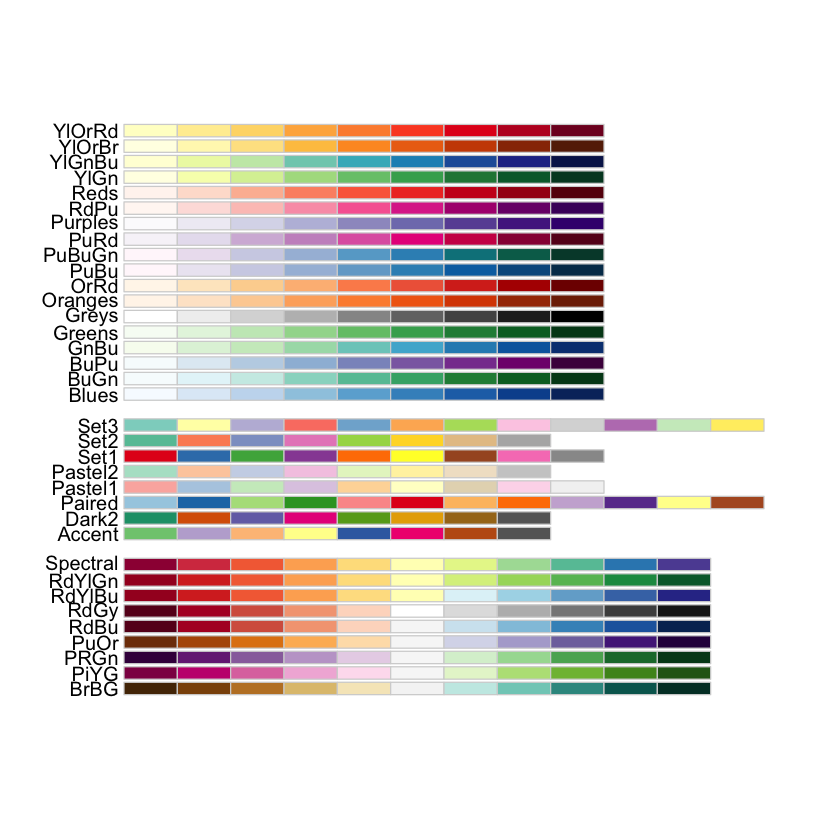

In [27]:
# Display color palette options 
display.brewer.all()

In [28]:
# Set color palette for map
my_colors <- brewer.pal(9, "RdYlGn") 
my_colors <- colorRampPalette(my_colors)(9)
my_colors <- my_colors[as.numeric(m$group)]

[1] "Runtime: 1.06424880027771"


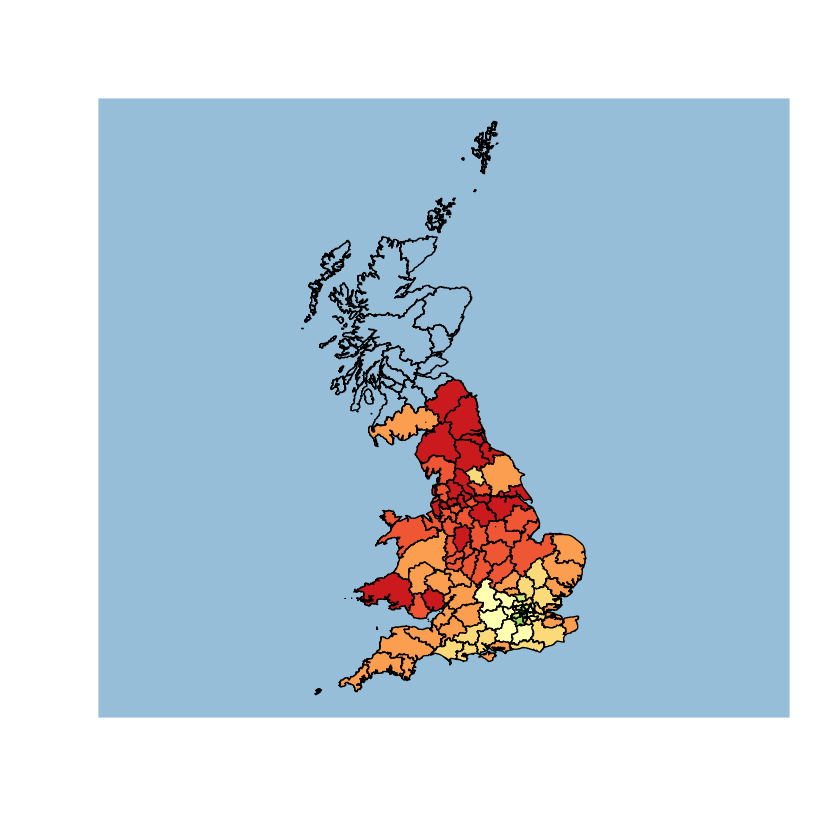

In [29]:
# Visualize map
start_time <- Sys.time()

plot(m, col = my_colors ,  bg = "#A6CAE0")

end_time <- Sys.time()
print(paste("Runtime:", end_time - start_time))

From the chloropleth map above we observe that the post areas surrounding London have the highest median house prices. The further north the lower the median house prices. To the east and west of London also have lower median house prices than London, but not as low as the north of England.

## B3. Mean vs Median

<ins>Instructions</ins>
<br/>
"*Instead of using median price, you could have been asked to colour-code the mean house price. Would that have given a better view of the house prices across the UK? Please justify your answer.*"

In general with economic data it is the case that some individuals are outliers and have a lot (e.g. in income data). In that case the problem with analyzing the mean is that it will be signficantly higher than the median as the few high-income individuals bias the mean upwards. However, these individuals are few and far between and hence are not very representative of the rest of the population. I suspect this also holds for housing prices. Figure B3 shows the distributions of mean and median, respectively. As suspected, some observations have very high mean house prices ($>$400,000 GBP) which is not the case for the median.
<br>
Figure 3b (bottom) shows a geospatial representation of a map using the median and the mean while color-coding each post area. The figure is constructed in QGIS due to the long computational run time constructing geospatial maps in `R`. From the figure it is evident again that using the mean gives higher values than the median. These are especialy concentrated around London. 
<br> In general, using the mean price instead of median would not have given a better view of the house prices in the UK. It would have been a distorted picture becasue some areas have more outliers than others that bias their mean gouse prices up and hence is not good for comparisons across municipalities.

In [54]:
# Set global plot options
options(repr.plot.width=16, repr.plot.height=7)
global_size = 14
options(scipen = 999)

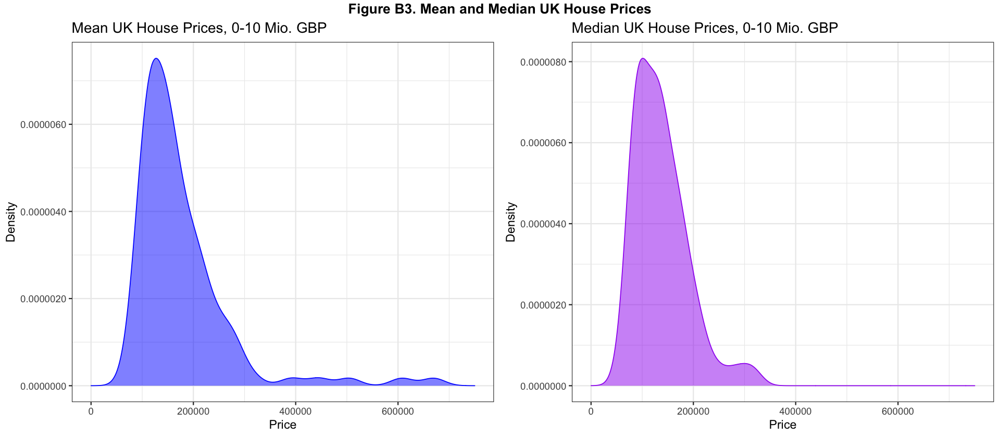

In [60]:
require(scales)

# Density plot of mean prices
p1 <- ggplot(data = area_price, aes(x = price_mean)) +
    geom_density(fill = "blue", 
                 color = "blue", 
                 alpha = 0.5) +
    #scale_x_continuous(labels = comma) + 
    scale_y_continuous(labels = comma) +
    xlim(0, 750000) +
    xlab("Price") +
    ylab("Density") + 
    ggtitle("Mean UK House Prices, 0-10 Mio. GBP") +
    theme_bw(base_size = global_size)

# Density plot of median prices
p2 <- ggplot(data = area_price, aes(x = price_median)) +
    geom_density(fill = "purple", 
                 color = "purple", 
                 alpha = 0.5) +
    #scale_x_continuous(labels = comma) + 
    scale_y_continuous(labels = comma) +
    xlim(0, 750000) +
    xlab("Price") +
    ylab("Density") + 
    ggtitle("Median UK House Prices, 0-10 Mio. GBP") +
    theme_bw(base_size = global_size)

# Combine 2 subplots
fig <- ggarrange(p1, p2)
annotate_figure(fig, top = text_grob("Figure B3a. Mean and Median UK House Prices",
                                      face = "bold", 
                                      size = 16)) 

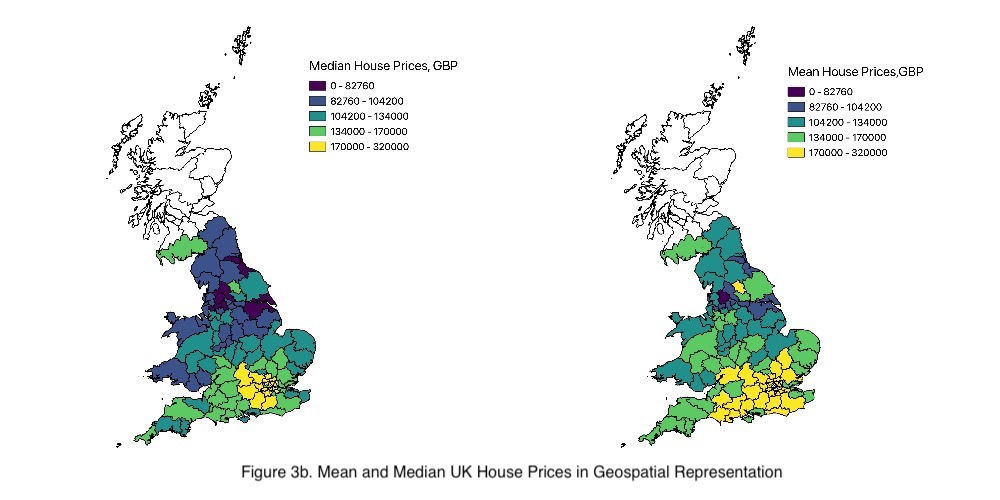